In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os # accessing directory structure
#plt.style.use('seaborn')
pd.set_option('display.max_columns', None)

In [4]:
data = pd.read_csv('/content/drive/MyDrive/dataset/Crimes_-_2001_to_Present.csv')
data

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,2422,24,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,2515,25,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,1711,17,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,1922,19,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,632,6,6.0,44.0,08B,1183071.0,1847869.0,2023,12/09/2023 03:41:24 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
916948,2245416,HH516687,07/17/2002 02:15:00 PM,105XX S EWING AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,432,4,10.0,52.0,08A,1202174.0,1835655.0,2002,02/28/2018 03:56:25 PM,41.703770,-87.535284,"(41.703769594, -87.535283853)"
916949,2324412,HH601127,08/24/2002 02:40:00 AM,038XX W 62ND ST,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,823,8,13.0,65.0,14,1151774.0,1863216.0,2002,02/10/2018 03:50:01 PM,41.780535,-87.719119,"(41.78053524, -87.719119292)"
916950,2338581,HH635488,09/09/2002 02:56:00 AM,060XX N CICERO AVE,0610,BURGLARY,FORCIBLE ENTRY,RESTAURANT,False,False,1711,17,39.0,12.0,05,1143285.0,1939712.0,2002,02/28/2018 03:56:25 PM,41.990612,-87.748330,"(41.990611644, -87.748330104)"
916951,2292825,HH569869,08/09/2002 11:01:31 PM,025XX W VAN BUREN ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,1125,11,2.0,28.0,08B,1159401.0,1898078.0,2002,02/28/2018 03:56:25 PM,41.876048,-87.690200,"(41.876047772, -87.690200324)"


In [6]:
data.shape

(916953, 22)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 916953 entries, 0 to 916952
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    916953 non-null  int64  
 1   Case Number           916953 non-null  object 
 2   Date                  916953 non-null  object 
 3   Block                 916953 non-null  object 
 4   IUCR                  916953 non-null  object 
 5   Primary Type          916953 non-null  object 
 6   Description           916953 non-null  object 
 7   Location Description  915279 non-null  object 
 8   Arrest                916953 non-null  bool   
 9   Domestic              916953 non-null  bool   
 10  Beat                  916953 non-null  int64  
 11  District              916953 non-null  int64  
 12  Ward                  302224 non-null  float64
 13  Community Area        304702 non-null  float64
 14  FBI Code              916953 non-null  object 
 15  

In [8]:
def summary(df):
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values
    summ['Duplicate'] = df.duplicated().sum()
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['avg'] = desc['mean'].values
    summ['std dev'] = desc['std'].values
    summ['top value'] = desc['top'].values
    summ['Freq'] = desc['freq'].values

    return summ

In [9]:
summary(data)

,data type,#missing,Duplicate,#unique,min,max,avg,std dev,top value,Freq
ID,int64,0,0,916953,634.0,13485473.0,4236251.817793,4766451.242937,NaN,NaN
Case Number,object,0,0,916388,NaN,NaN,NaN,NaN,HZ140230,6
Date,object,0,0,417077,NaN,NaN,NaN,NaN,01/01/2024 12:00:00 AM,88
Block,object,0,0,54308,NaN,NaN,NaN,NaN,100XX W OHARE ST,2769
IUCR,object,0,0,362,NaN,NaN,NaN,NaN,0460,122626
Primary Type,object,0,0,34,NaN,NaN,NaN,NaN,THEFT,184843
Description,object,0,0,460,NaN,NaN,NaN,NaN,SIMPLE,168802
Location Description,object,1674,0,211,NaN,NaN,NaN,NaN,STREET,278204
Arrest,bool,0,0,2,NaN,NaN,NaN,NaN,False,675901
Domestic,bool,0,0,2,NaN,NaN,NaN,NaN,False,764491


In [10]:
summary(data.drop(columns=["ID"])).style.background_gradient()

,data type,#missing,Duplicate,#unique,min,max,avg,std dev,top value,Freq
Case Number,object,0,167,916388,nan,nan,nan,nan,HZ140230,6
Date,object,0,167,417077,nan,nan,nan,nan,01/01/2024 12:00:00 AM,88
Block,object,0,167,54308,nan,nan,nan,nan,100XX W OHARE ST,2769
IUCR,object,0,167,362,nan,nan,nan,nan,0460,122626
Primary Type,object,0,167,34,nan,nan,nan,nan,THEFT,184843
Description,object,0,167,460,nan,nan,nan,nan,SIMPLE,168802
Location Description,object,1674,167,211,nan,nan,nan,nan,STREET,278204
Arrest,bool,0,167,2,nan,nan,nan,nan,False,675901
Domestic,bool,0,167,2,nan,nan,nan,nan,False,764491
Beat,int64,0,167,304,111.000000,2535.000000,1210.642171,711.334880,nan,nan


In [11]:
# Convert dates to pandas datetime format
data['Date'] = pd.to_datetime(data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Setting the index to be the date will help us later
data.index = pd.DatetimeIndex(data['Date'])


In [12]:
data.drop(['Case Number', 'IUCR','Updated On','Year', 'FBI Code', 'Beat','Ward','Community Area', 'Location'], inplace=True, axis=1)


In [13]:
data.shape

(916953, 13)

In [15]:
data['Primary Type'].value_counts()

Primary Type
THEFT                                184843
BATTERY                              170675
CRIMINAL DAMAGE                      102798
NARCOTICS                             80878
ASSAULT                               63636
OTHER OFFENSE                         58224
MOTOR VEHICLE THEFT                   57417
BURGLARY                              42799
DECEPTIVE PRACTICE                    35033
ROBBERY                               34858
CRIMINAL TRESPASS                     23407
HOMICIDE                              13152
WEAPONS VIOLATION                     12113
PROSTITUTION                           9261
OFFENSE INVOLVING CHILDREN             5181
PUBLIC PEACE VIOLATION                 4526
SEX OFFENSE                            4348
CRIM SEXUAL ASSAULT                    2463
LIQUOR LAW VIOLATION                   2450
ARSON                                  1919
CRIMINAL SEXUAL ASSAULT                1689
KIDNAPPING                             1425
GAMBLING           

In [17]:
# Removing these from primary type
data = data[(data['Primary Type'] != 'NON-CRIMINAL (SUBJECT SPECIFIED)') &
                (data['Primary Type'] != 'NON-CRIMINAL') &
                (data['Primary Type'] != 'NON - CRIMINAL') &
                (data['Primary Type'] != 'CONCEALED CARRY LICENSE VIOLATION') &
                (data['Primary Type'] != 'DOMESTIC VIOLENCE') &
                (data['Primary Type'] != 'PUBLIC INDECENCY') &
                (data['Primary Type'] != 'OBSCENITY') &
                (data['Primary Type'] != 'RITUALISM')]


In [18]:
def combinePrimaryTypes(targetDf):
    '''
    This function helps combine PRIMARY CRIME TYPES
    '''
    targetDf.loc[targetDf['Primary Type'] == 'OTHER NARCOTIC VIOLATION', 'Primary Type'] = 'NARCOTICS'
    targetDf.loc[targetDf['Primary Type'].isin(['PROSTITUTION', 'CRIM SEXUAL ASSAULT']), 'Primary Type'] = 'SEX OFFENSE'
    targetDf.loc[targetDf['Primary Type'].isin(['LIQUOR LAW VIOLATION', 'RITUALISM', 'GAMBLING']), 'Primary Type'] = 'OTHER OFFENSE'
    targetDf.loc[targetDf['Primary Type'].isin(['CRIMINAL TRESPASS', 'ROBBERY']), 'Primary Type'] = 'ROBBERY'
    targetDf.loc[targetDf['Primary Type'] == 'INTERFERENCE WITH PUBLIC OFFICER', 'Primary Type'] = 'PUBLIC PEACE VIOLATION'
    targetDf.loc[targetDf['Primary Type'].isin(['INTIMIDATION', 'STALKING']), 'Primary Type'] = 'INTIMIDATION or STALKING'

    return targetDf

In [19]:
data = combinePrimaryTypes(data)

In [21]:
data['Primary Type'].value_counts()

Primary Type
THEFT                         184843
BATTERY                       170675
CRIMINAL DAMAGE               102798
NARCOTICS                      80890
ASSAULT                        63636
OTHER OFFENSE                  62005
ROBBERY                        58265
MOTOR VEHICLE THEFT            57417
BURGLARY                       42799
DECEPTIVE PRACTICE             35033
SEX OFFENSE                    16072
HOMICIDE                       13152
WEAPONS VIOLATION              12113
PUBLIC PEACE VIOLATION          5564
OFFENSE INVOLVING CHILDREN      5181
ARSON                           1919
CRIMINAL SEXUAL ASSAULT         1689
KIDNAPPING                      1425
INTIMIDATION or STALKING        1224
HUMAN TRAFFICKING                 10
Name: count, dtype: int64

In [8]:
crimeDf = pd.read_csv('/content/drive/MyDrive/dataset/Crimes_-_2001_to_Present.csv')
crimeDf

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,2422,24.0,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,2515,25.0,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,1711,17.0,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,1922,19.0,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,632,6.0,6.0,44.0,08B,1183071.0,1847869.0,2023,12/09/2023 03:41:24 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2782863,4750517,HM361263,05/19/2006 04:00:00 PM,001XX S WACKER DR,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,COMMERCIAL / BUSINESS OFFICE,False,True,111,1.0,2.0,32.0,26,1173889.0,1899510.0,2006,02/28/2018 03:56:25 PM,41.879667,-87.636963,"(41.879667054, -87.63696315)"
2782864,4758428,HM368900,05/23/2006 07:35:00 PM,071XX S VINCENNES AVE,0560,ASSAULT,SIMPLE,RESTAURANT,False,False,731,7.0,6.0,69.0,08A,1176589.0,1857611.0,2006,02/28/2018 03:56:25 PM,41.764632,-87.628312,"(41.764632089, -87.628311641)"
2782865,4910574,HM421348,06/18/2006 05:45:00 AM,001XX S KENTON AVE,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,SIDEWALK,True,False,1113,11.0,28.0,25.0,16,1145676.0,1899109.0,2006,02/28/2018 03:56:25 PM,41.879148,-87.740568,"(41.879148115, -87.740567984)"
2782866,4772511,HM361599,05/20/2006 12:38:31 AM,010XX W 95TH ST,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,STREET,True,False,2223,22.0,21.0,73.0,15,1171240.0,1841813.0,2006,02/10/2018 03:50:01 PM,41.721399,-87.648378,"(41.721398883, -87.648378015)"


In [9]:
#drop unecessary columns that we will not use
crimeDf = crimeDf.drop(columns=['Case Number','IUCR','Description', 'Beat', "District", "Ward", "FBI Code", "X Coordinate", "Y Coordinate", "Updated On",'Location'])
crimeDf = crimeDf.dropna()  #drop na values

In [10]:
crimeDf.set_index('Community Area',inplace=True)

In [11]:
#Pivot table with the 'Area' as the index, and 'Primary Type' as the columns
table2 = crimeDf.pivot_table(index='Community Area', columns='Primary Type', values='ID', aggfunc='count')

# Fill any missing values with 0
table2.fillna(0, inplace=True)   #cluster with Primary Type and Area

In [12]:
from sklearn import preprocessing
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

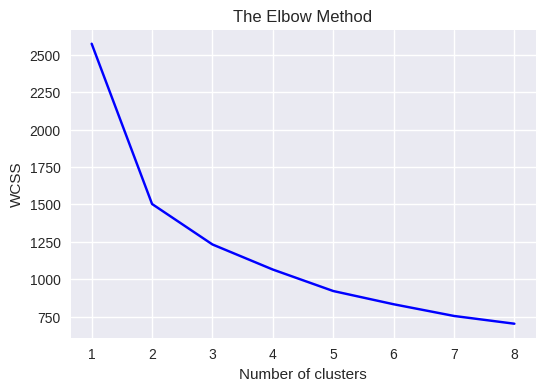

In [13]:
#implementing the elbow method

df_standardized = preprocessing.scale(table2)
df_standardized = pd.DataFrame(df_standardized)


plt.figure(figsize=(6,4))
wcss = []
for i in range (1, 9):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(df_standardized)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,9),wcss, 'bx-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Text(0.5, 0, 'Clusters')

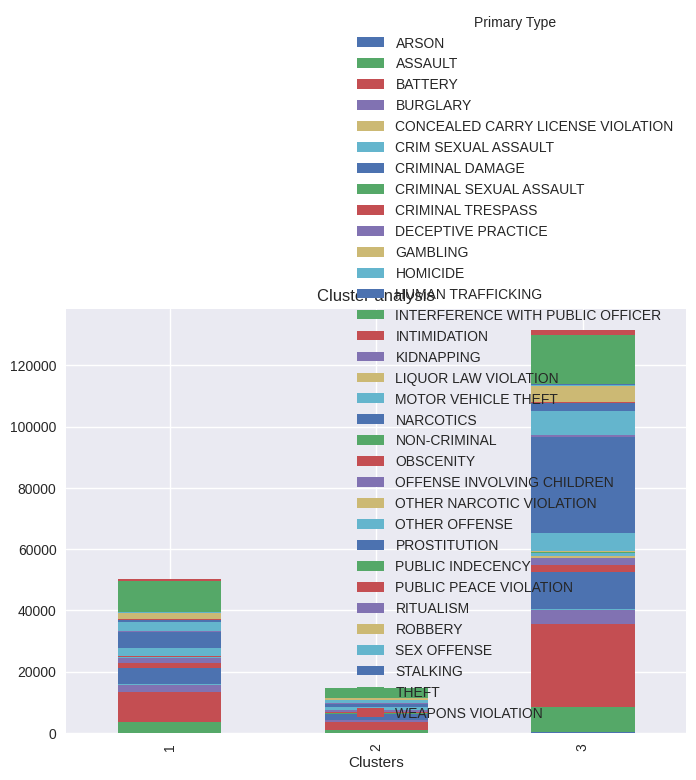

In [14]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++',random_state = 42)  #clustering με 3
y_kmeans = kmeans.fit_predict(df_standardized)
#beginning of the cluster numbering with 1 instead of 0
y_kmeans1 = y_kmeans + 1

#list called cluster
cluster = list(y_kmeans1)
#Adding cluster to our data set
table2['cluster'] = cluster

#Mean of clusters 1 to 6
kmeans_mean_cluster = pd.DataFrame(round(table2.groupby('cluster').mean(),1))
kmeans_mean_cluster.plot(kind='bar',stacked = True)
plt.rcParams["figure.figsize"] = (2,1)
plt.title("Cluster analysis")
plt.xlabel("Clusters")

In [15]:
#We will find which clusters belong in each cluster
table2[table2['cluster']==1]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,GAMBLING,HOMICIDE,HUMAN TRAFFICKING,INTERFERENCE WITH PUBLIC OFFICER,INTIMIDATION,KIDNAPPING,LIQUOR LAW VIOLATION,MOTOR VEHICLE THEFT,NARCOTICS,NON-CRIMINAL,OBSCENITY,OFFENSE INVOLVING CHILDREN,OTHER NARCOTIC VIOLATION,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Community Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,44.0,1980.0,6471.0,2053.0,2.0,111.0,4360.0,28.0,1299.0,1186.0,83.0,121.0,0.0,65.0,22.0,39.0,128.0,1340.0,3670.0,0.0,0.0,254.0,2.0,2561.0,486.0,0.0,166.0,0.0,1566.0,185.0,12.0,7340.0,285.0,1
3.0,33.0,2247.0,5981.0,1323.0,1.0,107.0,3190.0,36.0,1654.0,2032.0,40.0,107.0,0.0,34.0,16.0,25.0,135.0,1183.0,3781.0,0.0,2.0,188.0,2.0,2228.0,584.0,0.0,320.0,0.0,1012.0,340.0,16.0,8003.0,158.0,1
6.0,35.0,1465.0,4662.0,3514.0,3.0,101.0,4227.0,47.0,1129.0,2782.0,10.0,44.0,0.0,45.0,17.0,17.0,147.0,1663.0,1385.0,0.0,4.0,72.0,1.0,2138.0,401.0,1.0,218.0,0.0,1400.0,192.0,24.0,14194.0,119.0,1
8.0,26.0,3031.0,10177.0,1941.0,0.0,131.0,5081.0,105.0,5560.0,5188.0,30.0,133.0,0.0,124.0,31.0,24.0,151.0,1713.0,4760.0,0.0,3.0,190.0,2.0,2982.0,2210.0,6.0,325.0,2.0,1779.0,231.0,32.0,26309.0,490.0,1
19.0,115.0,2428.0,6438.0,2895.0,2.0,103.0,5434.0,24.0,728.0,1167.0,45.0,155.0,0.0,54.0,30.0,60.0,117.0,2988.0,1849.0,0.0,1.0,257.0,1.0,2864.0,703.0,0.0,237.0,0.0,1465.0,216.0,25.0,8041.0,441.0,1
22.0,120.0,2780.0,7496.0,3406.0,2.0,120.0,5732.0,21.0,887.0,1450.0,23.0,158.0,0.0,50.0,40.0,64.0,182.0,3147.0,2541.0,0.0,3.0,274.0,1.0,2890.0,1228.0,0.0,285.0,0.0,1923.0,245.0,29.0,13215.0,368.0,1
23.0,156.0,4382.0,13587.0,2416.0,5.0,192.0,6304.0,31.0,1083.0,1046.0,221.0,562.0,0.0,78.0,30.0,76.0,111.0,3322.0,16400.0,0.0,5.0,386.0,0.0,3380.0,793.0,0.0,338.0,0.0,2619.0,211.0,34.0,8741.0,911.0,1
24.0,165.0,3415.0,9295.0,4499.0,2.0,162.0,8887.0,34.0,1492.0,1934.0,52.0,193.0,0.0,65.0,40.0,33.0,248.0,4036.0,3969.0,0.0,3.0,245.0,3.0,3165.0,1327.0,2.0,349.0,0.0,2461.0,259.0,33.0,19442.0,544.0,1
27.0,47.0,2550.0,8229.0,1133.0,0.0,96.0,3170.0,25.0,709.0,510.0,114.0,361.0,0.0,71.0,25.0,30.0,55.0,1823.0,10391.0,0.0,1.0,206.0,0.0,1883.0,1303.0,1.0,165.0,0.0,1459.0,110.0,24.0,4585.0,527.0,1


In [23]:
table2[table2['cluster']==2]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,GAMBLING,HOMICIDE,HUMAN TRAFFICKING,INTERFERENCE WITH PUBLIC OFFICER,INTIMIDATION,KIDNAPPING,LIQUOR LAW VIOLATION,MOTOR VEHICLE THEFT,NARCOTICS,NON-CRIMINAL,OBSCENITY,OFFENSE INVOLVING CHILDREN,OTHER NARCOTIC VIOLATION,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Community Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.0,2.0,2.0,0.0,0.0,1.0,4.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,2
2.0,31.0,974.0,2619.0,1137.0,0.0,36.0,2800.0,11.0,277.0,844.0,26.0,70.0,0.0,12.0,14.0,35.0,60.0,1381.0,495.0,0.0,2.0,113.0,0.0,1490.0,18.0,0.0,80.0,0.0,608.0,89.0,11.0,4411.0,73.0,2
4.0,14.0,597.0,1709.0,740.0,0.0,23.0,1552.0,15.0,328.0,476.0,22.0,20.0,0.0,9.0,5.0,16.0,66.0,536.0,275.0,0.0,1.0,51.0,1.0,769.0,45.0,0.0,117.0,0.0,305.0,69.0,9.0,2864.0,38.0,2
5.0,12.0,482.0,1152.0,873.0,0.0,20.0,1303.0,6.0,474.0,499.0,19.0,21.0,0.0,8.0,5.0,13.0,43.0,411.0,424.0,0.0,1.0,54.0,0.0,749.0,82.0,0.0,41.0,0.0,254.0,42.0,12.0,2591.0,45.0,2
7.0,13.0,720.0,2159.0,2044.0,0.0,40.0,2571.0,17.0,916.0,1288.0,4.0,21.0,0.0,12.0,7.0,11.0,91.0,1121.0,362.0,0.0,0.0,63.0,0.0,961.0,181.0,0.0,63.0,0.0,665.0,102.0,7.0,10102.0,70.0,2
9.0,2.0,75.0,218.0,58.0,0.0,4.0,307.0,0.0,18.0,90.0,2.0,3.0,0.0,2.0,3.0,3.0,2.0,40.0,15.0,0.0,0.0,8.0,0.0,183.0,1.0,0.0,5.0,0.0,7.0,13.0,0.0,297.0,2.0,2
10.0,10.0,362.0,851.0,350.0,0.0,13.0,1211.0,6.0,121.0,403.0,9.0,9.0,0.0,3.0,4.0,17.0,22.0,268.0,140.0,0.0,3.0,22.0,1.0,654.0,5.0,1.0,27.0,0.0,39.0,36.0,4.0,1686.0,24.0,2
11.0,11.0,365.0,801.0,323.0,1.0,11.0,1014.0,3.0,118.0,329.0,12.0,16.0,0.0,4.0,4.0,15.0,29.0,334.0,165.0,0.0,1.0,36.0,1.0,572.0,3.0,1.0,34.0,0.0,95.0,32.0,7.0,1323.0,30.0,2
12.0,2.0,105.0,261.0,243.0,0.0,1.0,574.0,1.0,46.0,152.0,4.0,5.0,0.0,4.0,0.0,5.0,6.0,142.0,59.0,0.0,1.0,10.0,0.0,257.0,2.0,0.0,15.0,0.0,29.0,9.0,4.0,639.0,9.0,2


In [24]:
table2[table2['cluster']==3]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,GAMBLING,HOMICIDE,HUMAN TRAFFICKING,INTERFERENCE WITH PUBLIC OFFICER,INTIMIDATION,KIDNAPPING,LIQUOR LAW VIOLATION,MOTOR VEHICLE THEFT,NARCOTICS,NON-CRIMINAL,OBSCENITY,OFFENSE INVOLVING CHILDREN,OTHER NARCOTIC VIOLATION,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Community Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
25.0,178.0,5700.0,18342.0,3016.0,0.0,285.0,7858.0,83.0,1554.0,1544.0,303.0,1109.0,1.0,110.0,53.0,84.0,158.0,3936.0,20953.0,0.0,3.0,494.0,0.0,5236.0,1701.0,3.0,321.0,0.0,3585.0,287.0,28.0,11016.0,1364.0,3


In [16]:
d = crimeDf.groupby(['Community Area','Primary Type']).size().reset_index().rename(columns={0:'Counts'})
d = d.sort_values(by=['Community Area','Counts'],ascending=False)
d = d.groupby('Community Area').head(3).sort_values(by=['Community Area','Counts'],ascending=False)
d

,Community Area,Primary Type,Counts
2146,77.0,THEFT,6255
2122,77.0,BATTERY,3710
2125,77.0,CRIMINAL DAMAGE,2791
2118,76.0,THEFT,4437
2100,76.0,CRIMINAL TRESPASS,1538
...,...,...,...
11,1.0,BATTERY,6471
15,1.0,CRIMINAL DAMAGE,4360
8,0.0,THEFT,8
3,0.0,CRIMINAL DAMAGE,7


In [17]:
c = table2.copy()
c = c.reset_index(drop=False)
c = c[['Community Area','cluster']]
crimeDf_clusters = crimeDf.copy()
df_clusters = pd.merge(crimeDf_clusters, c, on='Community Area', how='inner')

In [18]:
import plotly.express as px

In [19]:
#Create a Crime Map of Chicago using Plotly

#limit the data to a fraction of the original dataset
df_filtered = df_clusters.sample(frac=0.05)
fig = px.scatter_mapbox(df_filtered, lat="Latitude", lon="Longitude", hover_name="Primary Type", color='cluster',color_continuous_scale= ['#009900', '#0000cc', '#cc0000'], hover_data=["Location Description", "Community Area" ,"Block","Arrest"], zoom=12, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()
#plot the map to see how our clustering looks like

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans, DBSCAN
from sklearn.model_selection import GridSearchCV, train_test_split
import folium
from folium.plugins import HeatMap

In [4]:
df = pd.read_csv('/content/drive/MyDrive/dataset/Crimes_-_2001_to_Present.csv')
df

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,2422,24.0,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,2515,25.0,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,1711,17.0,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,1922,19.0,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,632,6.0,6.0,44.0,08B,1183071.0,1847869.0,2023,12/09/2023 03:41:24 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2782863,4750517,HM361263,05/19/2006 04:00:00 PM,001XX S WACKER DR,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,COMMERCIAL / BUSINESS OFFICE,False,True,111,1.0,2.0,32.0,26,1173889.0,1899510.0,2006,02/28/2018 03:56:25 PM,41.879667,-87.636963,"(41.879667054, -87.63696315)"
2782864,4758428,HM368900,05/23/2006 07:35:00 PM,071XX S VINCENNES AVE,0560,ASSAULT,SIMPLE,RESTAURANT,False,False,731,7.0,6.0,69.0,08A,1176589.0,1857611.0,2006,02/28/2018 03:56:25 PM,41.764632,-87.628312,"(41.764632089, -87.628311641)"
2782865,4910574,HM421348,06/18/2006 05:45:00 AM,001XX S KENTON AVE,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,SIDEWALK,True,False,1113,11.0,28.0,25.0,16,1145676.0,1899109.0,2006,02/28/2018 03:56:25 PM,41.879148,-87.740568,"(41.879148115, -87.740567984)"
2782866,4772511,HM361599,05/20/2006 12:38:31 AM,010XX W 95TH ST,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,STREET,True,False,2223,22.0,21.0,73.0,15,1171240.0,1841813.0,2006,02/10/2018 03:50:01 PM,41.721399,-87.648378,"(41.721398883, -87.648378015)"


In [7]:
df['Year'].unique()

array([2007, 2021, 2023, 2002, 2019, 2020, 2011, 2015, 2014, 2022, 2018,
       2010, 2004, 2013, 2017, 2016, 2005, 2001, 2012, 2008, 2003, 2009,
       2006, 2024])

In [5]:
df['Date'] = pd.to_datetime(df['Date'])
df['Hour'] = df['Date'].dt.hour.apply(lambda x: '{:02d}'.format(x))
df['Time'] = df['Hour'].str[:2].astype(int)

In [6]:
df1 = df.copy()
df1 = df1.dropna()
df1['Arrest'] = df1['Arrest'].astype(int)

<ipython-input-6-19f9024c761b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Arrest'] = df1['Arrest'].astype(int)


In [8]:
new_df = df1.copy()

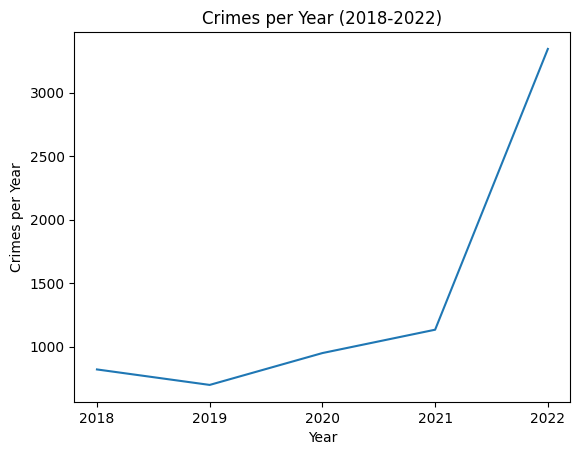

In [9]:
df2023 = new_df[new_df['Year'] == 2023]
len(df2023.index)
#So far in 2023, there has been 61,254 crimes committed

df2022 = new_df[new_df['Year'] == 2022]
len(df2022.index)
#In 2022, there has been 237,880 crimes committed

df2021 = new_df[new_df['Year'] == 2021]
len(df2021.index)
#In 2021, there has been 208,539 crimes committed

df2020 = new_df[new_df['Year'] == 2020]
len(df2020.index)
#In 2020, there has been 212,076 crimes committed

df2019 = new_df[new_df['Year'] == 2019]
len(df2019.index)
#In 2019, there has been 261,237 crimes committed

df2018 = new_df[new_df['Year'] == 2018]
len(df2018.index)
#In 2018, there has been 268,767 crimes committed

#Line chart showing number of crimes per year
import matplotlib.pyplot as plt
year = ['2018', '2019', '2020', '2021', '2022']
crime = [len(df2018), len(df2019), len(df2020), len(df2021), len(df2022)]
plt.plot(year, crime)
plt.title("Crimes per Year (2018-2022)")
plt.xlabel("Year")
plt.ylabel("Crimes per Year")
plt.show()

In [12]:
# 2018-2023 Responses for Primary Type
value_counts = new_df['Primary Type'].value_counts()
crimes = pd.DataFrame(value_counts)
print(value_counts)
type(value_counts)

Primary Type
THEFT                                433908
BATTERY                              400814
CRIMINAL DAMAGE                      251122
NARCOTICS                            222972
ASSAULT                              138280
OTHER OFFENSE                        136571
MOTOR VEHICLE THEFT                  115469
BURGLARY                             111219
ROBBERY                               78253
CRIMINAL TRESPASS                     67542
DECEPTIVE PRACTICE                    67251
PROSTITUTION                          26556
WEAPONS VIOLATION                     23011
OFFENSE INVOLVING CHILDREN            13291
HOMICIDE                              12783
PUBLIC PEACE VIOLATION                11392
SEX OFFENSE                            8918
CRIM SEXUAL ASSAULT                    6317
LIQUOR LAW VIOLATION                   4825
GAMBLING                               4331
ARSON                                  3881
INTERFERENCE WITH PUBLIC OFFICER       2622
KIDNAPPING         

pandas.core.series.Series

In [14]:
crimes.columns

Index(['count'], dtype='object')

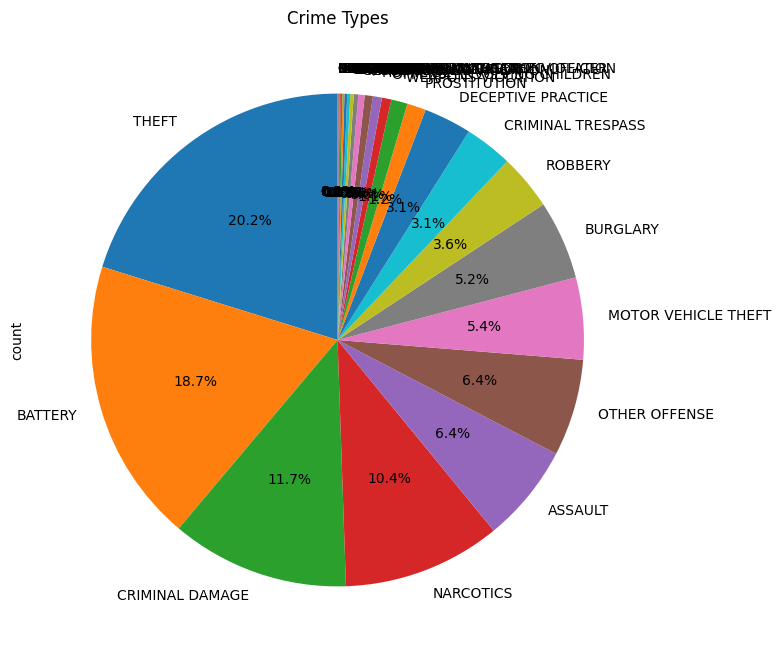

In [15]:
crimes.plot.pie(y='count', figsize=(8, 8), autopct='%1.1f%%', startangle=90)
plt.legend().remove()
plt.title('Crime Types')
plt.show()

In [18]:
import folium
from folium.plugins import HeatMap

df = df.dropna(subset=['Latitude', 'Longitude'])

crime_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=11)
HeatMap(data=df[['Latitude', 'Longitude']], radius=10).add_to(crime_map)

crime_map
crime_map.save('index.html')

In [20]:
from sklearn.preprocessing import LabelEncoder

In [21]:
df3 = df1.copy()

le = LabelEncoder()
df3['Primary Type1'] = le.fit_transform(df3['Primary Type'])
X = df3[['Primary Type1']]
y = df3['Arrest']
df3 = df3.dropna()
dfnew = pd.DataFrame(df3['Primary Type'], df3['Primary Type1'])
print(dfnew)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))

                  Primary Type
Primary Type1                 
11                       THEFT
11                       THEFT
3                     BURGLARY
2                     HOMICIDE
6              CRIMINAL DAMAGE
...                        ...
2                     HOMICIDE
23                     ASSAULT
1                     HOMICIDE
24                     ROBBERY
32               OTHER OFFENSE

[2148289 rows x 1 columns]
Accuracy: 0.8613501901512366
Confusion Matrix:
 [[454296   8095]
 [ 81263 100833]]
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.98      0.91    462391
           1       0.93      0.55      0.69    182096

    accuracy                           0.86    644487
   macro avg       0.89      0.77      0.80    644487
weighted avg       0.87      0.86      0.85    644487



In [22]:
df5 = df.copy()
df5 = df5.dropna()
X = df5[['Time']]
y = df5['Arrest']
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))

lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
correlation = np.corrcoef(y_pred_lr, y_test)


print('Correlation Coefficient:', correlation[1,1])
# time is highly positively  correlated with arrests

Accuracy: 0.8613501901512366
Confusion Matrix:
 [[454296   8095]
 [ 81263 100833]]
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.98      0.91    462391
           1       0.93      0.55      0.69    182096

    accuracy                           0.86    644487
   macro avg       0.89      0.77      0.80    644487
weighted avg       0.87      0.86      0.85    644487

Correlation Coefficient: 1.0


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [24]:
import seaborn as sns

Text(0.5, 1.0, 'All Crime Distribution per District')

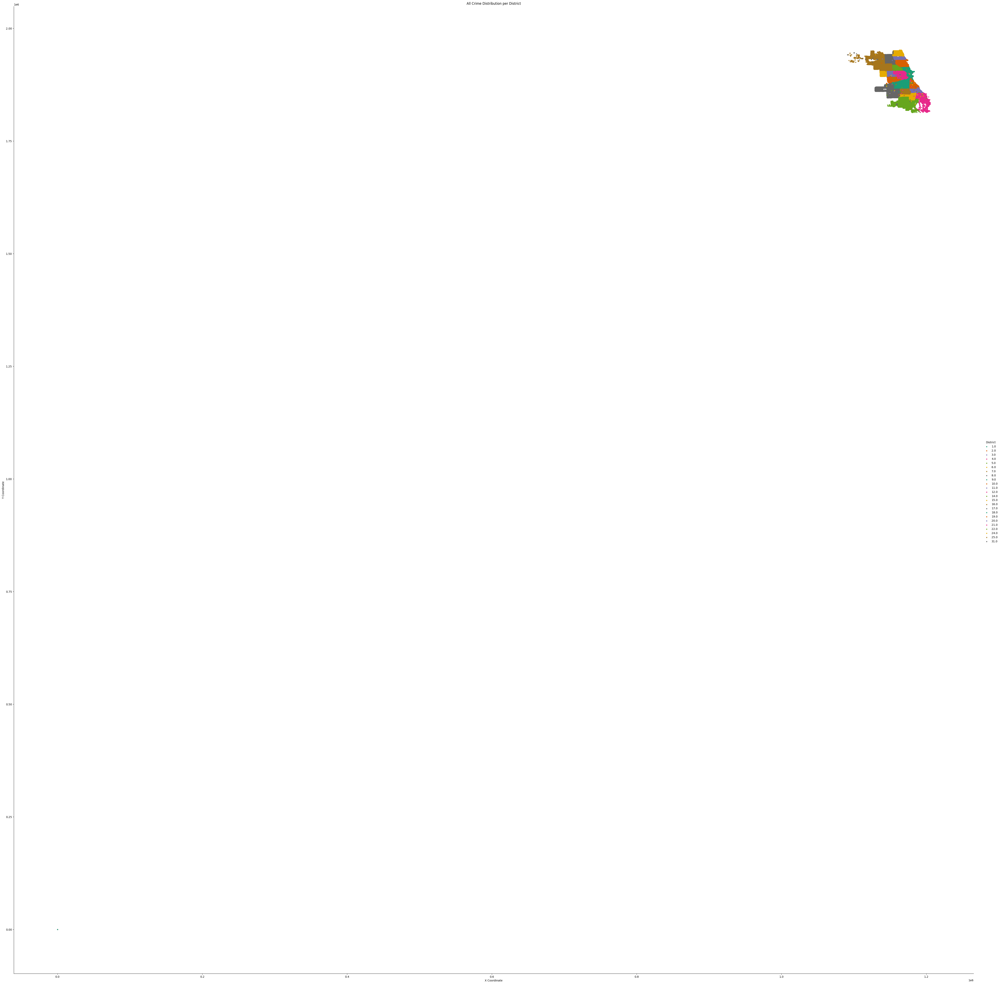

In [28]:
sns.lmplot(x='X Coordinate',
           y='Y Coordinate',
           data=df1[:],
           fit_reg=False,
           hue="District",
           palette='Dark2',
           height=50,
           ci=2,
           scatter_kws={"marker": "D",
                        "s": 10})
ax = plt.gca()
ax.set_title("All Crime Distribution per District")